In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2
import math
import random
import numpy as np
import tensorflow as tf
from collections import deque
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
from moviepy.editor import *
%matplotlib inline
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3063808/45929032 bytes (6.7%)7143424/45929032 bytes (15.6%)11190272/45929032 bytes (24.4%)15458304/45929032 bytes (33.7%)19611648/45929032 bytes (42.7%)23707648/45929032 bytes (51.6%)27869184/45929032 bytes (60.7%)32153600/45929032 bytes (70.0%)36225024/45929032 bytes (78.9%)40304640/45929032 bytes (87.8%)44556288/45929032 bytes (97.0%)45929032/45929032 bytes (100.0%)
  Done
File saved as /root

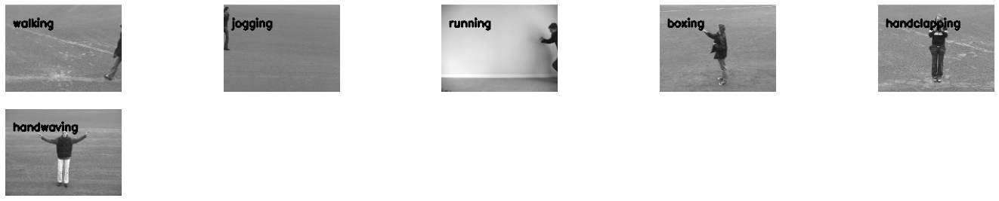

In [3]:
plt.figure(figsize = (25, 25))
all_action_classes = os.listdir('/content/drive/MyDrive/kth')


for val in range(len(all_action_classes)):

    
    selected_action_class = all_action_classes[val]
    video_files_names_list = os.listdir(f'/content/drive/MyDrive/kth/{selected_action_class}')
    selected_video_file_name = random.choice(video_files_names_list)
    video_reader = cv2.VideoCapture(f'/content/drive/MyDrive/kth/{selected_action_class}/{selected_video_file_name}')
    video_reader.set(1,10);
    ret, bgr_frame = video_reader.read()
    video_reader.release()
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    cv2.putText(rgb_frame, selected_action_class, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 2)
    plt.subplot(10,5, val+1);plt.imshow(rgb_frame);plt.axis('off')

In [4]:
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
frame_num = 35
DATASET_DIR = '/content/drive/MyDrive/kth'
CLASSES_LIST = ["boxing","handclapping","handwaving","running","walking"]

In [5]:
def frames_extraction(video_path):
    

    frames_list = []

    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/frame_num), 1)
    
    for frame_counter in range(frame_num):

        
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read() 

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)
      
    video_reader.release()
 
    return frames_list

In [6]:
def create_dataset():

    features = []
    labels = []
    video_files_paths = []
    
    
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        print(f'Extracting Data of Class: {class_name}')     
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))       
        for file_name in files_list:          
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)          
            frames = frames_extraction(video_file_path)            
            if len(frames) == frame_num:
               
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)      
    
    return features, labels, video_files_paths

In [7]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: boxing
Extracting Data of Class: handclapping
Extracting Data of Class: handwaving
Extracting Data of Class: running
Extracting Data of Class: walking


In [8]:
one_hot_encoded_labels = to_categorical(labels)
one_hot_encoded_labels.view()

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.]], dtype=float32)

In [9]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True)

In [10]:
def create_CNNLSTM():

    model = Sequential()
    
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (frame_num, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(MaxPooling2D((4, 4)))) 
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    model.summary()
    return model

In [11]:
# Construct the model.
CNNLSTM_model = create_CNNLSTM()
print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 35, 64, 64, 16)   448       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 35, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 35, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 35, 16, 16, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 35, 4, 4, 32)     0

In [13]:

early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
CNNLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
CNNLSTM_model_training_history = CNNLSTM_model.fit(x = features_train, y = labels_train, epochs = 90, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/90
38/38 [==============================] - 15s 50ms/step - loss: 1.6234 - accuracy: 0.1946 - val_loss: 1.6120 - val_accuracy: 0.1200
Epoch 2/90
38/38 [==============================] - 1s 25ms/step - loss: 1.6105 - accuracy: 0.2315 - val_loss: 1.6167 - val_accuracy: 0.1200
Epoch 3/90
38/38 [==============================] - 1s 25ms/step - loss: 1.5908 - accuracy: 0.2651 - val_loss: 1.4879 - val_accuracy: 0.3067
Epoch 4/90
38/38 [==============================] - 1s 25ms/step - loss: 1.2184 - accuracy: 0.4262 - val_loss: 1.2229 - val_accuracy: 0.2533
Epoch 5/90
38/38 [==============================] - 1s 26ms/step - loss: 0.9557 - accuracy: 0.5000 - val_loss: 0.9720 - val_accuracy: 0.4400
Epoch 6/90
38/38 [==============================] - 1s 25ms/step - loss: 0.9191 - accuracy: 0.4765 - val_loss: 0.9167 - val_accuracy: 0.4800
Epoch 7/90
38/38 [==============================] - 1s 24ms/step - loss: 0.8561 - accuracy: 0.5336 - val_loss: 0.9764 - val_accuracy: 0.3733
Epoch 8/90
3

In [14]:
# Evaluate the trained model.
model_evaluation_history = CNNLSTM_model.evaluate(features_test, labels_test)

4/4 [==============================] - 1s 129ms/step - loss: 0.5463 - accuracy: 0.7680


In [15]:
def plot_metric(model_training_history, metric_name_1, plot_name):
   
    
    metric_value_1 = model_training_history.history[metric_name_1]
    epochs = range(len(metric_value_1))
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.grid(axis='y')
    plt.title(str(plot_name))
    plt.legend()

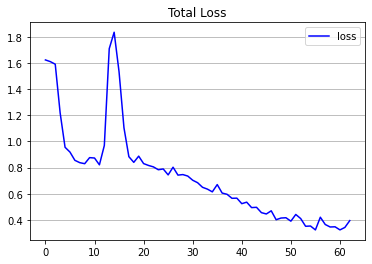

In [17]:
# Visualize the training and validation loss metrices.
plot_metric(CNNLSTM_model_training_history, 'loss', 'Total Loss')

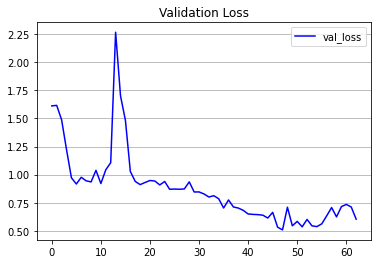

In [18]:
# Visualize the training and validation loss metrices.
plot_metric(CNNLSTM_model_training_history, 'val_loss', 'Validation Loss')

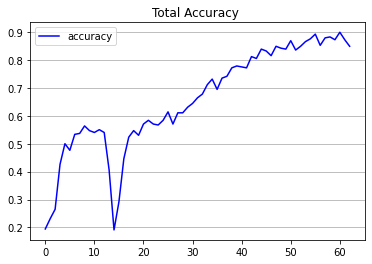

In [19]:
# Visualize the training and validation accuracy metrices.
plot_metric(CNNLSTM_model_training_history, 'accuracy', 'Total Accuracy ')

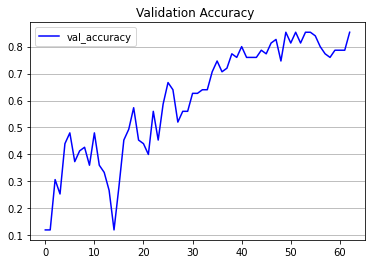

In [20]:
# Visualize the training and validation accuracy metrices.
plot_metric(CNNLSTM_model_training_history, 'val_accuracy', 'Validation Accuracy ')

In [21]:
# Calculate Accuracy On Test Dataset
acc = 0
for i in range(len(features_test)):
  predicted_label = np.argmax(CNNLSTM_model.predict(np.expand_dims(features_test[i],axis =0))[0])
  actual_label = np.argmax(labels_test[i])
  if predicted_label == actual_label:
      acc += 1
acc = (acc * 100)/len(labels_test)
print("Accuracy on test data =",acc)

Accuracy on test data = 76.8


In [22]:
def predict_single_action(video_file_path, frame_num):
    

  
    video_reader = cv2.VideoCapture(video_file_path)

    
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/frame_num),1)
    for frame_counter in range(frame_num):

        
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)


        success, frame = video_reader.read() 

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255

        frames_list.append(normalized_frame)

    
    predicted_labels_probabilities = CNNLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    
    predicted_label = np.argmax(predicted_labels_probabilities)

    
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
     
    video_reader.release()

In [25]:

video_title = '/content/drive/MyDrive/predict/box_pred.mp4'
input_video_file_path = '/content/drive/MyDrive/predict/box_pred.mp4'
predict_single_action(input_video_file_path, frame_num)
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

Action Predicted: boxing
Confidence: 0.9500858187675476


100%|█████████▉| 791/792 [00:03<00:00, 210.18it/s]


In [24]:

video_title = '/content/drive/MyDrive/predict/pred5_r.mp4'
input_video_file_path = '/content/drive/MyDrive/predict/pred5_r.mp4'
predict_single_action(input_video_file_path, frame_num)
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

Action Predicted: handwaving
Confidence: 0.4487299919128418


100%|██████████| 318/318 [00:01<00:00, 225.91it/s]
